In [1]:
# Importo las librerías a usar

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import os
import warnings 
warnings.filterwarnings("ignore")
import missingno as msno


import requests
from fuzzywuzzy import process
import re

from scipy.stats import chi2_contingency

import funciones 

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
# creo el path, las lista de archivos y la variables de archivos csv

path = r"C:\Users\angel\Desktop\Data analyst\Curso Data Analyst\Proyecto final\Fintech\data\data"

lista = os.listdir(path)
print(lista)

archivos_csv = [archivo for archivo in lista if archivo.endswith(".csv")]
print(archivos_csv)

['bank-additional_bank-additional-full.csv', 'data_info - copia.pdf', 'data_info.rtf']
['bank-additional_bank-additional-full.csv']


In [4]:
# creo la ruta, formada por el path y el archivo, generando el df

ruta = os.path.join(path,archivos_csv[0])
df = pd.read_csv(ruta,sep=";")
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 41,188 filas y 21 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las últimas cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74,retired,married,professional.course,no,yes,no,cellular,nov,fri,239,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,no


----------------------------------------------------------------------------------------------------
¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
19974,38,technician,married,professional.course,no,yes,no,cellular,aug,fri,848,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,yes
32974,24,technician,single,basic.9y,no,yes,no,cellular,may,mon,111,6,999,0,nonexistent,-1.8,92.893,-46.2,1.299,5099.1,no
30947,34,admin.,married,university.degree,no,yes,no,cellular,may,tue,442,2,999,1,failure,-1.8,92.893,-46.2,1.344,5099.1,no
5084,49,technician,married,professional.course,no,no,no,telephone,may,fri,736,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes
39981,35,admin.,married,university.degree,no,yes,no,cellular,jun,tue,385,1,5,1,success,-1.7,94.055,-39.8,0.761,4991.6,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las columnas del conjunto de datos?
	- age
	- job
	- marital
	- education
	- default
	- housing
	- loan
	- contact
	- month
	- day_of_week
	- duration
	- campaign
	- pdays
	- previous
	- poutcome
	- emp.var.rate
	- cons.price.idx
	- cons.conf.idx
	- euribor3m
	- nr.employed
	- y
----------------------------------------------------------------------------------------------------
¿Cuál es el tipo de datos de cada columna?
age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     flo

,0
age,"[56, 57, 37, 40, 45, 59, 41, 24, 25, 29, 35, 5..."
job,"[housemaid, services, admin., blue-collar, tec..."
marital,"[married, single, divorced, unknown]"
education,"[basic.4y, high.school, basic.6y, basic.9y, pr..."
default,"[no, unknown, yes]"
housing,"[no, yes, unknown]"
loan,"[no, yes, unknown]"
contact,"[telephone, cellular]"
month,"[may, jun, jul, aug, oct, nov, dec, mar, apr, ..."
day_of_week,"[mon, tue, wed, thu, fri]"


----------------------------------------------------------------------------------------------------
¿Cuáles son las estadísticas descriptivas básicas de todas las columnas?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.0,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188.0,41188.0,41188.0,41188.0,41188,41188.0,41188.0,41188.0,41188.0,41188.0,41188
unique,,12,4,8,3,3,3,2,10,5,,,,,3,,,,,,2
top,,admin.,married,university.degree,no,yes,no,cellular,may,thu,,,,,nonexistent,,,,,,no
freq,,10422,24928,12168,32588,21576,33950,26144,13769,8623,,,,,35563,,,,,,36548
mean,40.02406,,,,,,,,,,258.28501,2.567593,962.475454,0.172963,,0.081886,93.575664,-40.5026,3.621291,5167.035911,
std,10.42125,,,,,,,,,,259.279249,2.770014,186.910907,0.494901,,1.57096,0.57884,4.628198,1.734447,72.251528,
min,17.0,,,,,,,,,,0.0,1.0,0.0,0.0,,-3.4,92.201,-50.8,0.634,4963.6,
25%,32.0,,,,,,,,,,102.0,1.0,999.0,0.0,,-1.8,93.075,-42.7,1.344,5099.1,
50%,38.0,,,,,,,,,,180.0,2.0,999.0,0.0,,1.1,93.749,-41.8,4.857,5191.0,
75%,47.0,,,,,,,,,,319.0,3.0,999.0,0.0,,1.4,93.994,-36.4,4.961,5228.1,


----------------------------------------------------------------------------------------------------
¿Cuántos valores nulos hay en cada columna del DataFrame?


age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

----------------------------------------------------------------------------------------------------
¿Cuál es el porcentaje de valores nulos por columna, ordenado de mayor a menor?


,Col,pct
0,age,0.0
1,job,0.0
2,marital,0.0
3,education,0.0
4,default,0.0
5,housing,0.0
6,loan,0.0
7,contact,0.0
8,month,0.0
9,day_of_week,0.0


----------------------------------------------------------------------------------------------------
## Valores nulos: Visualización


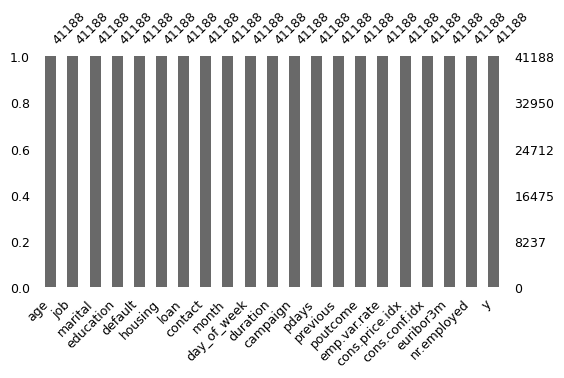

----------------------------------------------------------------------------------------------------
## Visualización de patrones en valores nulos


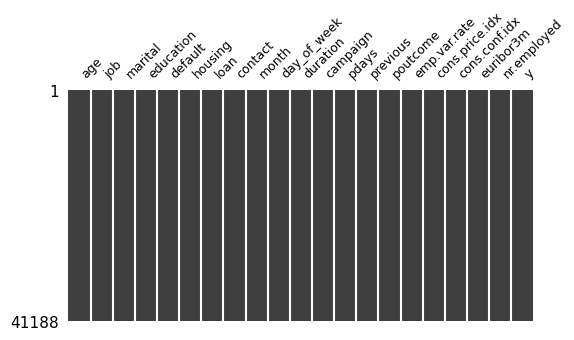

----------------------------------------------------------------------------------------------------


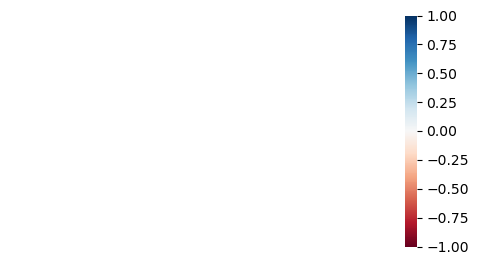

----------------------------------------------------------------------------------------------------
##########################################################################################


In [5]:
# mediante la funcion de exploracion_inicial de funciones realizo la exploración inicial

funciones.exploracion_inicial(df)

In [6]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [7]:
# veo el nombre de las columnas para cambiarlo posteriormente
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [8]:
# cambio de nombre de las columnas para entenderlas mejor

nuevo_nombre_columnas = ["edad","trabajo","estado_civil","educacion","credito_incumplido",
                         "prestamo_hipoteca","prestamo_personal","tipo_contacto","mes_ultimo_contacto",
                         "dia_semana_contacto","duracion_contacto_s","contactos_campaña",
                         "dias_desde_ultimo_contacto","contactos_previos",
                         "resultado_campaña_previa","tasa_variacion_empleo","indice_precio_consumo",
                         "indice_confianza_consumo","euribor3m","empleados","deposito_contratado"

]

df.columns = nuevo_nombre_columnas

In [9]:
df

,edad,trabajo,estado_civil,educacion,credito_incumplido,prestamo_hipoteca,prestamo_personal,tipo_contacto,mes_ultimo_contacto,dia_semana_contacto,duracion_contacto_s,contactos_campaña,dias_desde_ultimo_contacto,contactos_previos,resultado_campaña_previa,tasa_variacion_empleo,indice_precio_consumo,indice_confianza_consumo,euribor3m,empleados,deposito_contratado
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [10]:
df.dtypes

edad                            int64
trabajo                        object
estado_civil                   object
educacion                      object
credito_incumplido             object
prestamo_hipoteca              object
prestamo_personal              object
tipo_contacto                  object
mes_ultimo_contacto            object
dia_semana_contacto            object
duracion_contacto_s             int64
contactos_campaña               int64
dias_desde_ultimo_contacto      int64
contactos_previos               int64
resultado_campaña_previa       object
tasa_variacion_empleo         float64
indice_precio_consumo         float64
indice_confianza_consumo      float64
euribor3m                     float64
empleados                     float64
deposito_contratado            object
dtype: object

In [11]:
# creo una función para normalizar el texto, eliminando mayúsculas, espacion en blanco, sustituyo . por _ dentro de la palabra y elimino el . final

def normalizar(df):
    for col in df.select_dtypes("object").columns:
        df[col] = df[col].str.lower().str.strip()
        df[col] = df[col].str.replace(r"(?<=\w)\W(?=\w)", "_", regex=True)
        df[col] = df[col].str.replace(r"(?<=\w)-", "_", regex=True)
        df[col] = df[col].str.replace(r"(?<=\w)\W$", "", regex=True)

    return df

In [12]:
normalizar(df)

,edad,trabajo,estado_civil,educacion,credito_incumplido,prestamo_hipoteca,prestamo_personal,tipo_contacto,mes_ultimo_contacto,dia_semana_contacto,duracion_contacto_s,contactos_campaña,dias_desde_ultimo_contacto,contactos_previos,resultado_campaña_previa,tasa_variacion_empleo,indice_precio_consumo,indice_confianza_consumo,euribor3m,empleados,deposito_contratado
0,56,housemaid,married,basic_4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high_school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high_school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin,married,basic_6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high_school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional_course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue_collar,married,professional_course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university_degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional_course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [16]:
# creo una función para categorizar las columnas categóricas

def categorizar(df):
  df["trabajo"] = pd.Categorical(df["trabajo"],ordered=False)
  df["estado_civil"] = pd.Categorical(df["estado_civil"],ordered=False)
  df["educacion"] = pd.Categorical(df["educacion"],ordered=True,categories=["unknown","illiterate","basic_4y", "basic_6y", "basic_9y", "high_school", "professional_course", "university_degree"])
  df["credito_incumplido"] = pd.Categorical(df["credito_incumplido"],ordered=False)
  df["prestamo_hipoteca"] = pd.Categorical(df["prestamo_hipoteca"],ordered=False)
  df["prestamo_personal"] = pd.Categorical(df["prestamo_personal"],ordered=False)
  df["tipo_contacto"] = pd.Categorical(df["tipo_contacto"],ordered=False)
  df["mes_ultimo_contacto"] = pd.Categorical(df["mes_ultimo_contacto"],ordered=True,categories=["mar","apr","may","jun","jul","aug","sep","oct","nov","dec"])
  df["dia_semana_contacto"] = pd.Categorical(df["dia_semana_contacto"],ordered=True,categories=['mon', 'tue', 'wed', 'thu', 'fri'])
  df["resultado_campaña_previa"] = pd.Categorical(df["resultado_campaña_previa"],ordered=False)
  df["deposito_contratado"] = pd.Categorical(df["deposito_contratado"],ordered=False)
  df["deposito_contratado"] = df["deposito_contratado"].map({"yes": True, "no": False}).astype(bool)

  return df
            

In [17]:
categorizar(df)

,edad,trabajo,estado_civil,educacion,credito_incumplido,prestamo_hipoteca,prestamo_personal,tipo_contacto,mes_ultimo_contacto,dia_semana_contacto,duracion_contacto_s,contactos_campaña,dias_desde_ultimo_contacto,contactos_previos,resultado_campaña_previa,tasa_variacion_empleo,indice_precio_consumo,indice_confianza_consumo,euribor3m,empleados,deposito_contratado
0,56,housemaid,married,basic_4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
1,57,services,married,high_school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
2,37,services,married,high_school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
3,40,admin,married,basic_6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
4,56,services,married,high_school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional_course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True
41184,46,blue_collar,married,professional_course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41185,56,retired,married,university_degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41186,44,technician,married,professional_course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True


In [18]:
df.dtypes

edad                             int64
trabajo                       category
estado_civil                  category
educacion                     category
credito_incumplido            category
prestamo_hipoteca             category
prestamo_personal             category
tipo_contacto                 category
mes_ultimo_contacto           category
dia_semana_contacto           category
duracion_contacto_s              int64
contactos_campaña                int64
dias_desde_ultimo_contacto       int64
contactos_previos                int64
resultado_campaña_previa      category
tasa_variacion_empleo          float64
indice_precio_consumo          float64
indice_confianza_consumo       float64
euribor3m                      float64
empleados                      float64
deposito_contratado               bool
dtype: object

In [19]:
# elimino los duplicados

df = df[~df.duplicated()]
df

,edad,trabajo,estado_civil,educacion,credito_incumplido,prestamo_hipoteca,prestamo_personal,tipo_contacto,mes_ultimo_contacto,dia_semana_contacto,duracion_contacto_s,contactos_campaña,dias_desde_ultimo_contacto,contactos_previos,resultado_campaña_previa,tasa_variacion_empleo,indice_precio_consumo,indice_confianza_consumo,euribor3m,empleados,deposito_contratado
0,56,housemaid,married,basic_4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
1,57,services,married,high_school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
2,37,services,married,high_school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
3,40,admin,married,basic_6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
4,56,services,married,high_school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional_course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True
41184,46,blue_collar,married,professional_course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41185,56,retired,married,university_degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41186,44,technician,married,professional_course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True


In [20]:
# creo bins para la edad

df["edad"] = pd.cut(df["edad"],bins=5,labels=["<20","20-35","35-50","50-75",">75"])

In [21]:
# Análisis univariante

# variables categóricas

col_cat = [col for col in df.select_dtypes(["category","bool"]).columns.tolist()]
col_cat



['edad',
 'trabajo',
 'estado_civil',
 'educacion',
 'credito_incumplido',
 'prestamo_hipoteca',
 'prestamo_personal',
 'tipo_contacto',
 'mes_ultimo_contacto',
 'dia_semana_contacto',
 'resultado_campaña_previa',
 'deposito_contratado']

In [22]:
for col in col_cat:
    funciones.graficar_barras_relativo_px(df,col)

In [23]:
# variables numéricas

col_num = [col for col in df.select_dtypes("number").columns.tolist()]
col_num

['duracion_contacto_s',
 'contactos_campaña',
 'dias_desde_ultimo_contacto',
 'contactos_previos',
 'tasa_variacion_empleo',
 'indice_precio_consumo',
 'indice_confianza_consumo',
 'euribor3m',
 'empleados']

In [24]:
for col in col_num:
    funciones.graficar_histograma_px(df,col)

In [25]:
for col in col_num:
    funciones.graficar_boxplot_px(df,col)

In [26]:
df

,edad,trabajo,estado_civil,educacion,credito_incumplido,prestamo_hipoteca,prestamo_personal,tipo_contacto,mes_ultimo_contacto,dia_semana_contacto,duracion_contacto_s,contactos_campaña,dias_desde_ultimo_contacto,contactos_previos,resultado_campaña_previa,tasa_variacion_empleo,indice_precio_consumo,indice_confianza_consumo,euribor3m,empleados,deposito_contratado
0,35-50,housemaid,married,basic_4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
1,35-50,services,married,high_school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
2,20-35,services,married,high_school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
3,20-35,admin,married,basic_6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
4,35-50,services,married,high_school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,50-75,retired,married,professional_course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True
41184,20-35,blue_collar,married,professional_course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41185,35-50,retired,married,university_degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,False
41186,20-35,technician,married,professional_course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,True


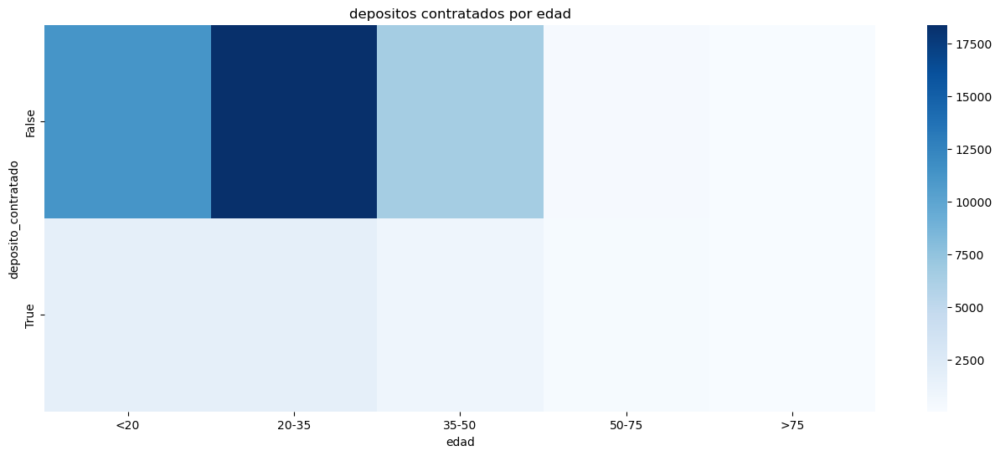

In [27]:
# análisis bivariante

# Mediante un mapa de calor, veo el numero de casos en los que se le otorgado un depósito en función de la edad"

tabla_graf_1= pd.crosstab(df["deposito_contratado"], df["edad"])  

plt.figure(figsize=(16, 6))
sns.heatmap(tabla_graf_1, annot=False, cmap="Blues")
plt.title("depositos contratados por edad")
plt.xlabel("edad")
plt.ylabel("deposito_contratado")
plt.show()



In [28]:
graf_2 = px.box(df,x="deposito_contratado",y="duracion_contacto_s",color="deposito_contratado",color_discrete_map={True: "#6a994e",False: "#cc2636"})

graf_2.update_layout(title="Distribución de la variable deposito_contratado en función de la duración de la llamada",width=1300,height=500,plot_bgcolor="white",paper_bgcolor="white")
graf_2.update_yaxes(showgrid=True,gridcolor="#D3D3D3",linecolor="#D3D3D3")

graf_2.show()

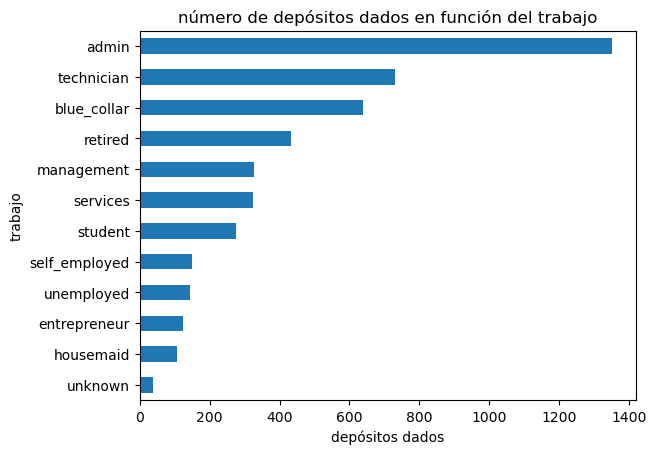

In [29]:
df[df["deposito_contratado"] == True].groupby("trabajo")["deposito_contratado"].size().sort_values(ascending=True).plot(kind="barh")
plt.title("número de depósitos dados en función del trabajo") 
plt.xlabel("depósitos dados")
plt.show()

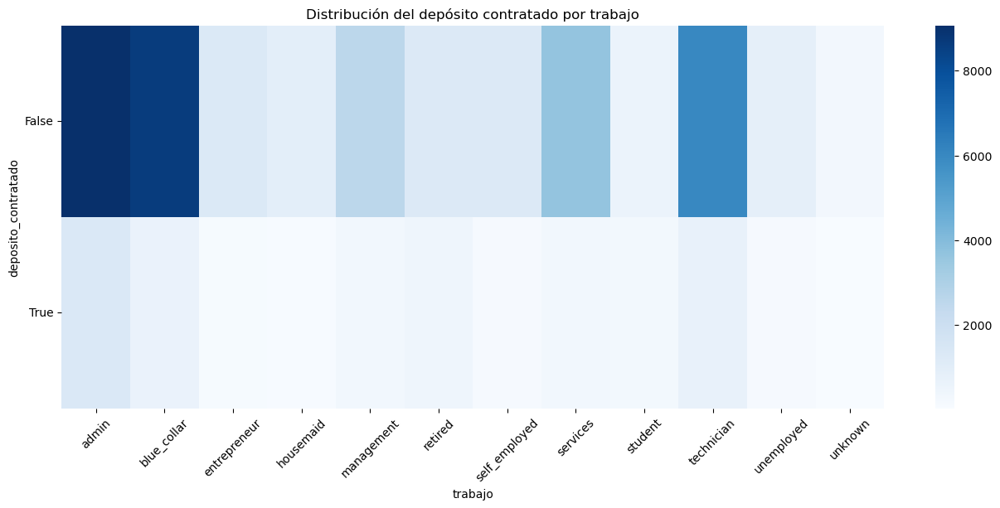

In [30]:
# Mediante un mapa de calor, veo el numero de casos en los que se le otorgado un depósito en función de la edad"

tabla_graf_2= pd.crosstab(df["deposito_contratado"], df["trabajo"])  

plt.figure(figsize=(16, 6))
sns.heatmap(tabla_graf_2, annot=False, cmap="Blues")
plt.title("Distribución del depósito contratado por trabajo")
plt.xlabel("trabajo")
plt.ylabel("deposito_contratado")
plt.yticks(rotation=0)
plt.xticks(rotation=45)
plt.show()

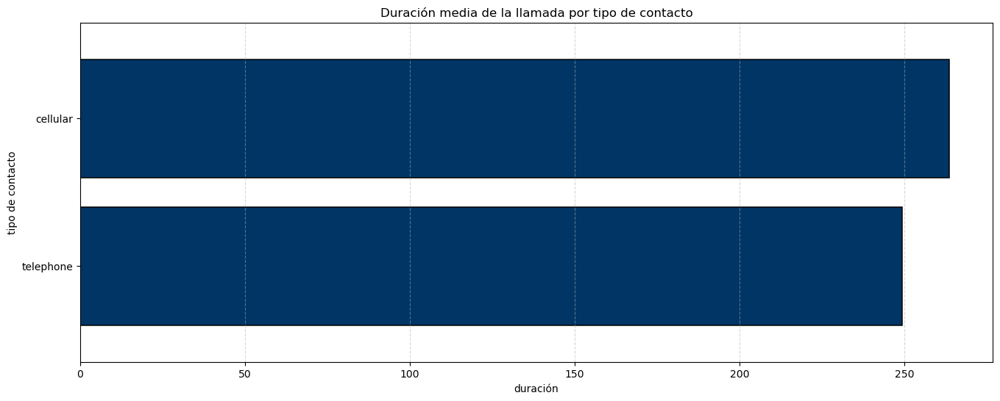

In [31]:
cont_graf_4 = df.groupby("tipo_contacto")["duracion_contacto_s"].mean().sort_values()

ax = cont_graf_4.plot(
    kind="barh",
    title="Duración media de la llamada por tipo de contacto",
    figsize=(16,6),
    color = "#003566",
    edgecolor="black",
    linewidth=1.1,
    width=0.8,
    ylabel="tipo de contacto",
    xlabel="duración", 
)
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.gca().xaxis.get_major_locator().set_params(integer=True)
ax.ticklabel_format(style='plain', axis='x')
plt.show()



In [ ]:
# test independcia chi-2 

In [33]:
df.select_dtypes(include="category").columns.tolist()

['edad',
 'trabajo',
 'estado_civil',
 'educacion',
 'credito_incumplido',
 'prestamo_hipoteca',
 'prestamo_personal',
 'tipo_contacto',
 'mes_ultimo_contacto',
 'dia_semana_contacto',
 'resultado_campaña_previa']

In [39]:
tabla_cross = pd.crosstab(df["deposito_contratado"],df["trabajo"])
tabla_cross

trabajo,admin,blue_collar,entrepreneur,housemaid,management,retired,self_employed,services,student,technician,unemployed,unknown
deposito_contratado,,,,,,,,,,,,
False,9068,8615,1332,954,2596,1284,1272,3644,600,6009,870,293
True,1351,638,124,106,328,434,149,323,275,730,144,37


In [35]:
chi2, p, dof, expected = chi2_contingency(tabla_cross)

print(f"Chi2: {chi2:.3f}")
print(f"p-value: {p}")


Chi2: 961.744
p-value: 3.2684116066165443e-199


test de independencia entre variables categóricas y deposito_contratado

In [36]:
def calcular_chi2(df):
    for col in df.select_dtypes(include="category").columns.tolist():
        print("################################# variable {} ###################################".format(col))
        print()

        tabla_cross = pd.crosstab(df["deposito_contratado"],df[col])
    
        chi2, p, dof, expected = chi2_contingency(tabla_cross)

        print(f"Chi2: {chi2:.3f}")
        print(f"p-value: {p}")
        print()  

        if p < 0.05:
            print("""existe una relación significativa entre {} y la variable depósito contratado. La probabilidad de que la asociación sea debida al azar es prácticamente nula.""".format(col))
            print()
        else:
            print("no existe una relación significativa entre {} y la variable depósito contratado".format(col))
            print()



In [37]:
calcular_chi2(df)

################################# variable edad ###################################

Chi2: 990.083
p-value: 5.031385634617203e-213

existe una relación significativa entre edad y la variable depósito contratado. La probabilidad de que la asociación sea debida al azar es prácticamente nula.

################################# variable trabajo ###################################

Chi2: 961.744
p-value: 3.2684116066165443e-199

existe una relación significativa entre trabajo y la variable depósito contratado. La probabilidad de que la asociación sea debida al azar es prácticamente nula.

################################# variable estado_civil ###################################

Chi2: 122.959
p-value: 1.778422500461116e-26

existe una relación significativa entre estado_civil y la variable depósito contratado. La probabilidad de que la asociación sea debida al azar es prácticamente nula.

################################# variable educacion ###################################

Chi2: 192.84

In [ ]:
# ya que el tamaño del dataset es muy grande, incluso diferencias muy pequeñas entre categorías producen un chi2 enorme y p-value prácticamente cero. 
# Para ver la fuerza de esa relación podemos hacer Cramer´s V

In [76]:
def cramers_v(df):

    for col in df.select_dtypes(include="category").columns:

        tabla = pd.crosstab(df["deposito_contratado"], df[col])
        chi2, p, dof, expected = chi2_contingency(tabla)
        n = tabla.sum().sum()
        min_dim = min(tabla.shape[0] - 1, tabla.shape[1] - 1)

        if min_dim == 0:
            print(f"{col}: no se puede calcular Cramér's V")
            continue
        v = np.sqrt(chi2 / (n * min_dim))

        if v >= 0.5:
            fuerza = "fuerte"
        elif v >= 0.3:
            fuerza = "moderada"
        elif v >= 0.1:
            fuerza = "débil"
        else:
            fuerza = "despreciable"

        print("Cramér's V entre 'deposito_contratado' y '{}': {:.3f}, por lo que la relación entre ambas variables es {}".format(col,v,fuerza))

In [77]:
cramers_v(df)

Cramér's V entre 'deposito_contratado' y 'edad': 0.155, por lo que la relación entre ambas variables es débil
Cramér's V entre 'deposito_contratado' y 'trabajo': 0.153, por lo que la relación entre ambas variables es débil
Cramér's V entre 'deposito_contratado' y 'estado_civil': 0.055, por lo que la relación entre ambas variables es despreciable
Cramér's V entre 'deposito_contratado' y 'educacion': 0.068, por lo que la relación entre ambas variables es despreciable
Cramér's V entre 'deposito_contratado' y 'credito_incumplido': 0.099, por lo que la relación entre ambas variables es despreciable
Cramér's V entre 'deposito_contratado' y 'prestamo_hipoteca': 0.012, por lo que la relación entre ambas variables es despreciable
Cramér's V entre 'deposito_contratado' y 'prestamo_personal': 0.005, por lo que la relación entre ambas variables es despreciable
Cramér's V entre 'deposito_contratado' y 'tipo_contacto': 0.145, por lo que la relación entre ambas variables es débil
Cramér's V entre 'de